In [1]:
import os
import shutil
from PIL import Image
import numpy as np

In [2]:
cancer_path = "/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Cancer"
controles_path = "/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Controles"
output_path = "/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris"

os.makedirs(output_path, exist_ok=True)

if not os.path.exists(output_path ):
    os.makedirs(output_path )


In [3]:
def copy_images_and_masks(src_dir, label):
    for subdir in os.listdir(src_dir):
        subdir_path = os.path.join(src_dir, subdir)
        
        if os.path.isdir(subdir_path):
            dest_folder = os.path.join(output_path, subdir)
            os.makedirs(dest_folder, exist_ok=True)
            
            images_dir = os.path.join(dest_folder, "images")
            masks_dir = os.path.join(dest_folder, "masks")
            os.makedirs(images_dir, exist_ok=True)
            os.makedirs(masks_dir, exist_ok=True)
            
            image_filename = os.path.join(subdir_path, "Original", subdir + ".jpg")
            if os.path.exists(image_filename):
                dest_image_filename = os.path.join(images_dir, subdir + ".jpg")
                shutil.copy(image_filename, dest_image_filename)
                print(f"Imagen copiada: {dest_image_filename}")
            
            mask_dir = os.path.join(subdir_path, "Mask")
            for mask_filename in os.listdir(mask_dir):
                if mask_filename.endswith(".jpg"):
                    full_mask_path = os.path.join(mask_dir, mask_filename)
                    dest_mask_filename = os.path.join(masks_dir, mask_filename.replace("(", "_").replace(")", ""))
                    shutil.copy(full_mask_path, dest_mask_filename)
                    print(f"Máscara copiada: {dest_mask_filename}")

copy_images_and_masks(cancer_path , "Cancer")

copy_images_and_masks(controles_path, "Controles")

print("Copiado completado.")

Imagen copiada: /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00069C/images/00069C.jpg
Máscara copiada: /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00069C/masks/00069C_1.jpg
Imagen copiada: /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00047C/images/00047C.jpg
Máscara copiada: /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00047C/masks/00047C_1.jpg
Imagen copiada: /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00115C/images/00115C.jpg
Máscara copiada: /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00115C/masks/00115C_1.jpg
Imagen copiada: /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/0010

In [4]:
organized_path = "/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris"

def print_image_details(image_path):
    try:
        img = Image.open(image_path)
        img_array = np.array(img)
        
        print(f"\nCaracterísticas de la Imagen {image_path}:")
        print(f"Tamaño de la imagen: {img.size} (Ancho x Alto)")
        print(f"Forma del array (alto, ancho, canales): {img_array.shape}")
        print(f"Número de canales: {img_array.shape[2] if len(img_array.shape) > 2 else 1}")
        print(f"Valor mínimo de píxel: {img_array.min()}")
        print(f"Valor máximo de píxel: {img_array.max()}")
        print(f"Tipo de dato de los píxeles: {img_array.dtype}")
    except Exception as e:
        print(f"Error al procesar {image_path}: {e}")

for subdir in os.listdir(organized_path):
    subdir_path = os.path.join(organized_path, subdir)
    
    if os.path.isdir(subdir_path):
        images_dir = os.path.join(subdir_path, "images")
        masks_dir = os.path.join(subdir_path, "masks")
        
        if os.path.exists(images_dir):
            print(f"\n--- Procesando imágenes en {images_dir} ---")
            for img_filename in os.listdir(images_dir):
                if img_filename.endswith(".jpg") or img_filename.endswith(".png"):
                    image_path = os.path.join(images_dir, img_filename)
                    print_image_details(image_path)
        
        if os.path.exists(masks_dir):
            print(f"\n--- Procesando máscaras en {masks_dir} ---")
            for mask_filename in os.listdir(masks_dir):
                if mask_filename.endswith(".jpg") or mask_filename.endswith(".png"):
                    mask_path = os.path.join(masks_dir, mask_filename)
                    print_image_details(mask_path)

print("Análisis de imágenes y máscaras completado.")



--- Procesando imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00069C/images ---

Características de la Imagen /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00069C/images/00069C.jpg:
Tamaño de la imagen: (250, 250) (Ancho x Alto)
Forma del array (alto, ancho, canales): (250, 250, 3)
Número de canales: 3
Valor mínimo de píxel: 19
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Procesando máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00069C/masks ---

Características de la Imagen /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00069C/masks/00069C_1.jpg:
Tamaño de la imagen: (250, 250) (Ancho x Alto)
Forma del array (alto, ancho, canales): (250, 250, 3)
Número de canales: 3
Valor mínimo de píxel: 0
Valor máximo de píxel: 

________________ Redimensionamos _________________________

In [10]:
import os
from PIL import Image

organized_path = "/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris"
resized_output_path = "/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris"

os.makedirs(resized_output_path, exist_ok=True)

def resize_and_save_image(image_path, target_path, size=(256, 256), is_mask=False):
    try:
        # Convertir todo a escala de grises ("L")
        img = Image.open(image_path).convert("L")

        img_resized = img.resize(size, Image.Resampling.LANCZOS)
        img_resized.save(target_path, format="PNG")
        print(f"Imagen redimensionada y guardada: {target_path}")
    except Exception as e:
        print(f"Error al procesar {image_path}: {e}")

for subdir in os.listdir(organized_path):
    subdir_path = os.path.join(organized_path, subdir)

    if os.path.isdir(subdir_path):
        images_dir = os.path.join(subdir_path, "images")
        masks_dir = os.path.join(subdir_path, "masks")

        resized_subdir_path = os.path.join(resized_output_path, subdir)
        os.makedirs(resized_subdir_path, exist_ok=True)

        resized_images_dir = os.path.join(resized_subdir_path, "images")
        resized_masks_dir = os.path.join(resized_subdir_path, "masks")
        os.makedirs(resized_images_dir, exist_ok=True)
        os.makedirs(resized_masks_dir, exist_ok=True)

        if os.path.exists(images_dir):
            print(f"\n--- Procesando imágenes en {images_dir} ---")
            for img_filename in os.listdir(images_dir):
                if img_filename.lower().endswith((".jpg", ".png")):
                    image_path = os.path.join(images_dir, img_filename)
                    resized_image_path = os.path.join(resized_images_dir, os.path.splitext(img_filename)[0] + ".png")
                    resize_and_save_image(image_path, resized_image_path, size=(256, 256), is_mask=False)

        if os.path.exists(masks_dir):
            print(f"\n--- Procesando máscaras en {masks_dir} ---")
            for mask_filename in os.listdir(masks_dir):
                if mask_filename.lower().endswith((".jpg", ".png")):
                    mask_path = os.path.join(masks_dir, mask_filename)
                    resized_mask_path = os.path.join(resized_masks_dir, os.path.splitext(mask_filename)[0] + ".png")
                    resize_and_save_image(mask_path, resized_mask_path, size=(256, 256), is_mask=True)

print("Redimensionado completado.")


--- Procesando imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00069C/images ---
Imagen redimensionada y guardada: /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00069C/images/00069C.png

--- Procesando máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00069C/masks ---
Imagen redimensionada y guardada: /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00069C/masks/00069C_1.png

--- Procesando imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Organized_Cancer_Controles_gris/00047C/images ---
Imagen redimensionada y guardada: /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00047C/images/00047C.png

--- Procesando máscaras en /home/ann


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00069C/images ---

Características de la Imagen 00069C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 42
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00069C/masks ---

Características de la Máscara 00069C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 249
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00047C/images ---

Características de la Imagen 00047C.png:
Tamaño de la imagen (alto, an

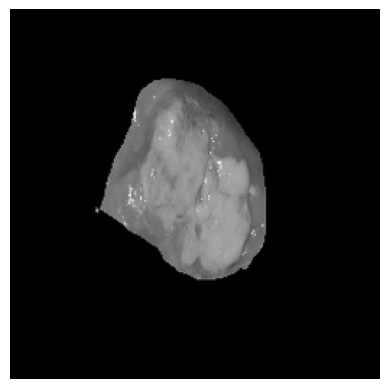


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00115C/images ---

Características de la Imagen 00115C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00115C/masks ---

Características de la Máscara 00115C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00101C/images ---

Características de la Imagen 00101C.png:
Tamaño de la imagen (alto, anc

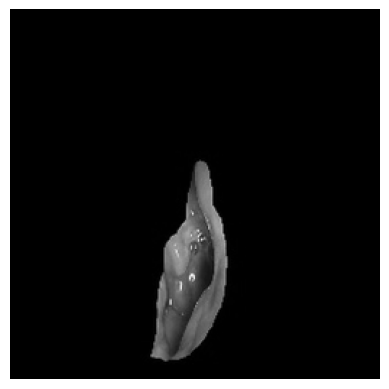


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00059C/images ---

Características de la Imagen 00059C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


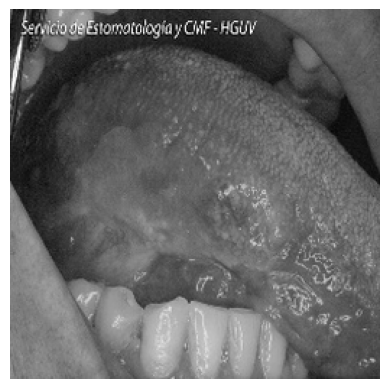


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00059C/masks ---

Características de la Máscara 00059C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 207
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00064/images ---

Características de la Imagen 00064.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00064/masks ---

Características de la Máscara 00064_1.png:
Tamaño de la imagen (alto, ancho

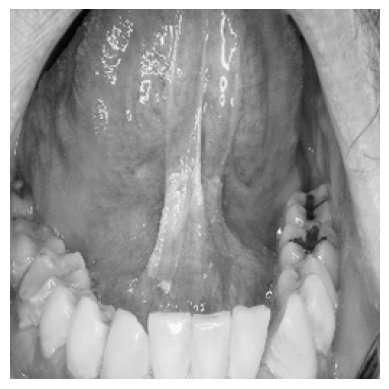


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00083/masks ---

Características de la Máscara 00083_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 248
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00109C/images ---

Características de la Imagen 00109C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00109C/masks ---

Características de la Máscara 00109C_1.png:
Tamaño de la imagen (alto, anc

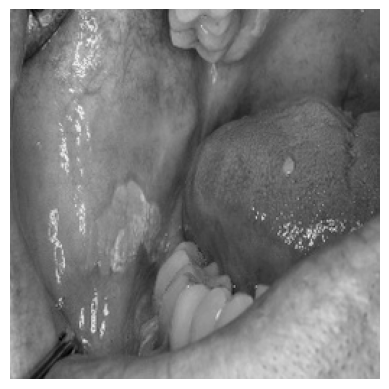


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00106/masks ---

Características de la Máscara 00106_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 194
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00186/images ---

Características de la Imagen 00186.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00186/masks ---

Características de la Máscara 00186_1.png:
Tamaño de la imagen (alto, ancho, 

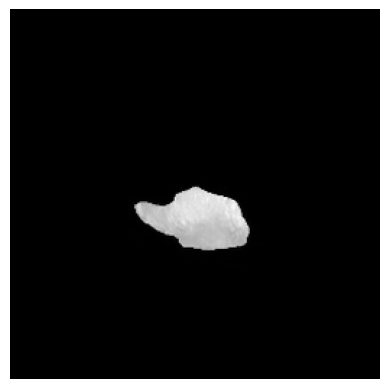


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00065/images ---

Características de la Imagen 00065.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 14
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00065/masks ---

Características de la Máscara 00065_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 226
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00108C/images ---

Características de la Imagen 00108C.png:
Tamaño de la imagen (alto, ancho,

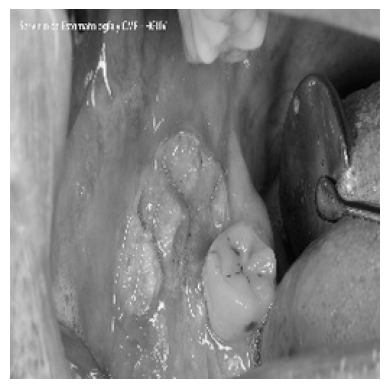


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00105C/masks ---

Características de la Máscara 00105C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00049C/images ---

Características de la Imagen 00049C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 3
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00049C/masks ---

Características de la Máscara 00049C_1.png:
Tamaño de la imagen (alto, a

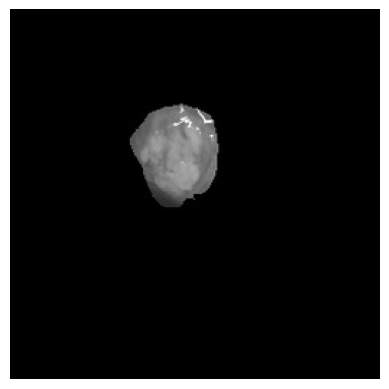


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00017/images ---

Características de la Imagen 00017.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00017/masks ---

Características de la Máscara 00017_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 170
Tipo de dato de los píxeles: uint8


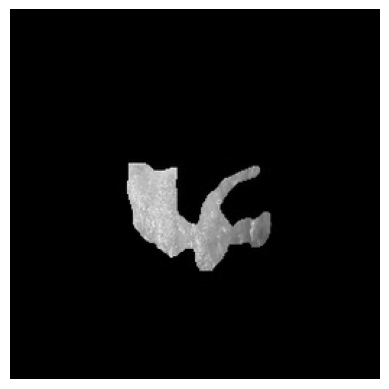


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00093/images ---

Características de la Imagen 00093.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 2
Valor máximo de píxel: 230
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00093/masks ---

Características de la Máscara 00093_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 191
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00175/images ---

Características de la Imagen 00175.png:
Tamaño de la imagen (alto, ancho, ca

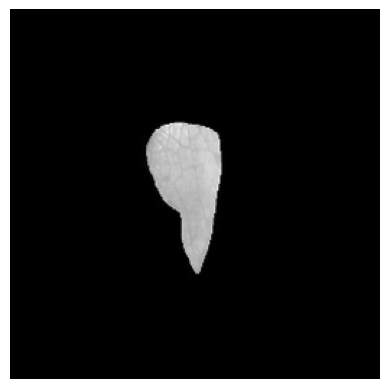


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00027/images ---

Características de la Imagen 00027.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 214
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00027/masks ---

Características de la Máscara 00027_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 215
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00087C/images ---

Características de la Imagen 00087C.png:
Tamaño de la imagen (alto, ancho,

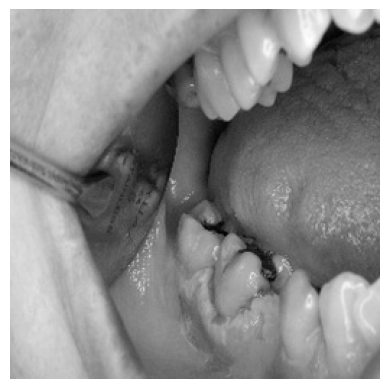


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00040/masks ---

Características de la Máscara 00040_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 188
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00131/images ---

Características de la Imagen 00131.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00131/masks ---

Características de la Máscara 00131_1.png:
Tamaño de la imagen (alto, ancho,

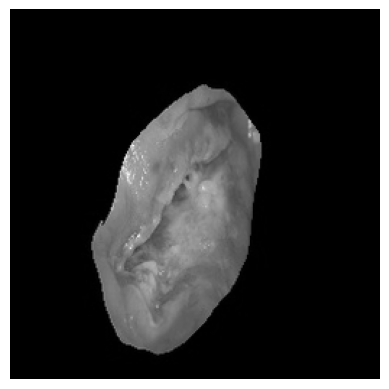


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00023/images ---

Características de la Imagen 00023.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 39
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00023/masks ---

Características de la Máscara 00023_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 228
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00104/images ---

Características de la Imagen 00104.png:
Tamaño de la imagen (alto, ancho, c

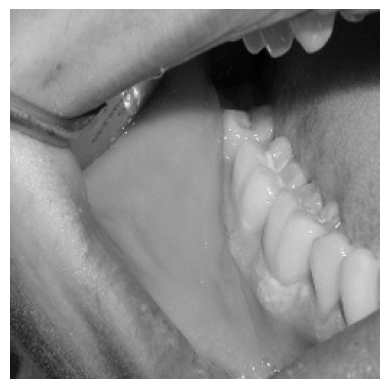


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00176/masks ---

Características de la Máscara 00176_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 229
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00165/images ---

Características de la Imagen 00165.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 27
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00165/masks ---

Características de la Máscara 00165_1.png:
Tamaño de la imagen (alto, ancho,

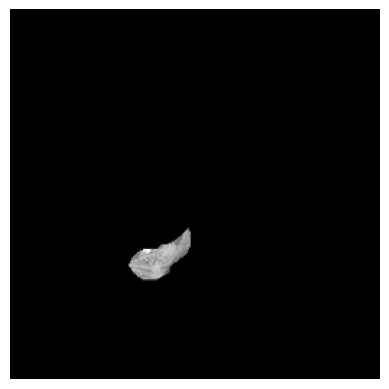


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00130/images ---

Características de la Imagen 00130.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 11
Valor máximo de píxel: 197
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00130/masks ---

Características de la Máscara 00130_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 196
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00115/images ---

Características de la Imagen 00115.png:
Tamaño de la imagen (alto, ancho, c

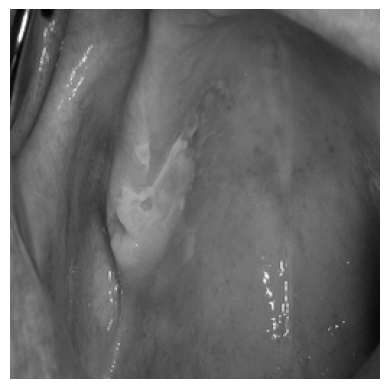


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00108/masks ---

Características de la Máscara 00108_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 218
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00024C/images ---

Características de la Imagen 00024C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00024C/masks ---

Características de la Máscara 00024C_1.png:
Tamaño de la imagen (alto, anc

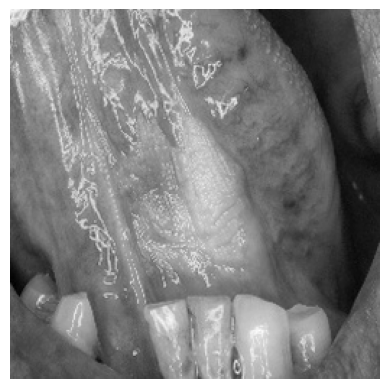


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00051/masks ---

Características de la Máscara 00051_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 212
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00089/images ---

Características de la Imagen 00089.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 226
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00089/masks ---

Características de la Máscara 00089_1.png:
Tamaño de la imagen (alto, ancho,

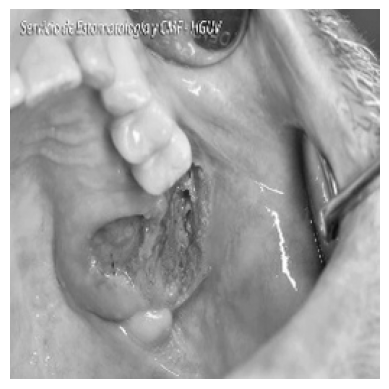


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00095C/masks ---

Características de la Máscara 00095C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 224
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00144/images ---

Características de la Imagen 00144.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00144/masks ---

Características de la Máscara 00144_1.png:
Tamaño de la imagen (alto, ancho

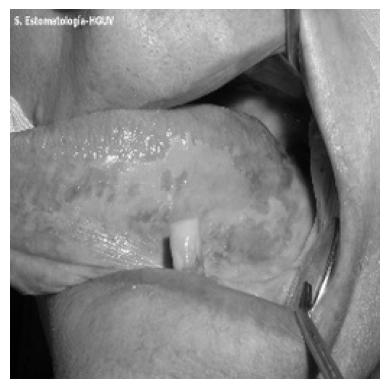


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00005/masks ---

Características de la Máscara 00005_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 249
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00057C/images ---

Características de la Imagen 00057C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 6
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


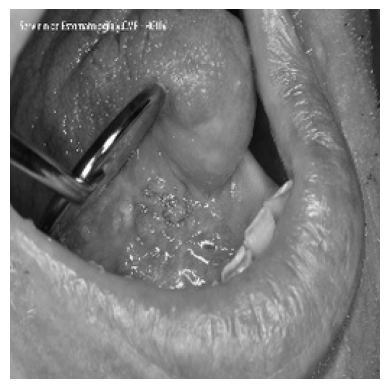


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00057C/masks ---

Características de la Máscara 00057C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00112/images ---

Características de la Imagen 00112.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00112/masks ---

Características de la Máscara 00112_1.png:
Tamaño de la imagen (alto, ancho

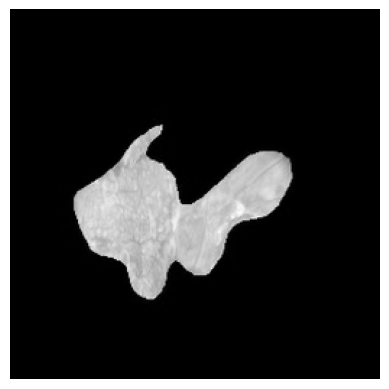


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00078/images ---

Características de la Imagen 00078.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 23
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


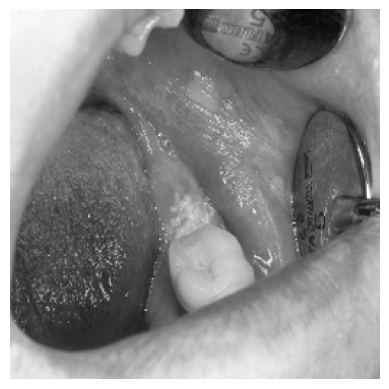


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00078/masks ---

Características de la Máscara 00078_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 245
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00032C/images ---

Características de la Imagen 00032C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00032C/masks ---

Características de la Máscara 00032C_1.png:
Tamaño de la imagen (alto, anc

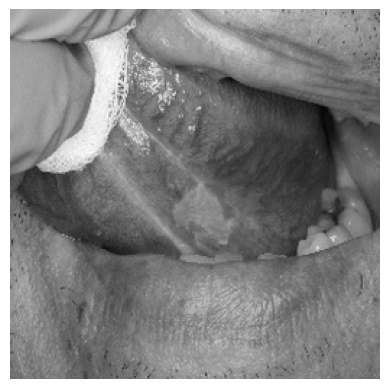


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00100/masks ---

Características de la Máscara 00100_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 175
Tipo de dato de los píxeles: uint8


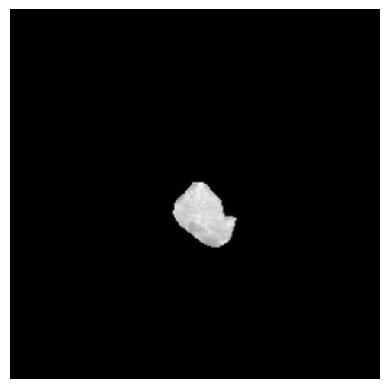


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00197/images ---

Características de la Imagen 00197.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


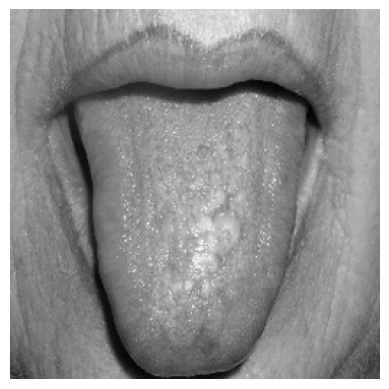


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00197/masks ---

Características de la Máscara 00197_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


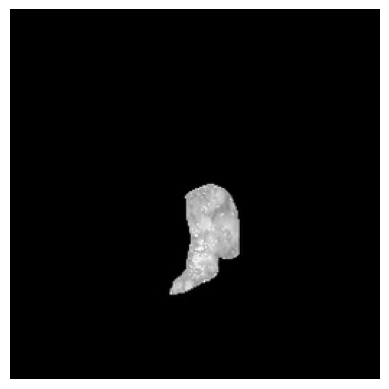


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00110C/images ---

Características de la Imagen 00110C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 33
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00110C/masks ---

Características de la Máscara 00110C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 220
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00116/images ---

Características de la Imagen 00116.png:
Tamaño de la imagen (alto, anch

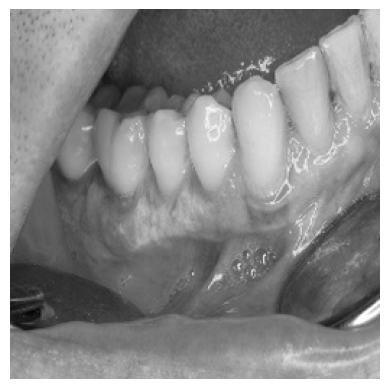


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00062/masks ---

Características de la Máscara 00062_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 199
Tipo de dato de los píxeles: uint8


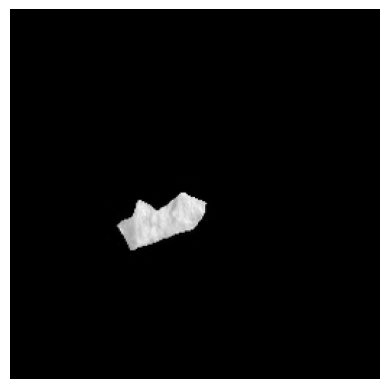


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00086C/images ---

Características de la Imagen 00086C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 7
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00086C/masks ---

Características de la Máscara 00086C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 254
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00195/images ---

Características de la Imagen 00195.png:
Tamaño de la imagen (alto, ancho

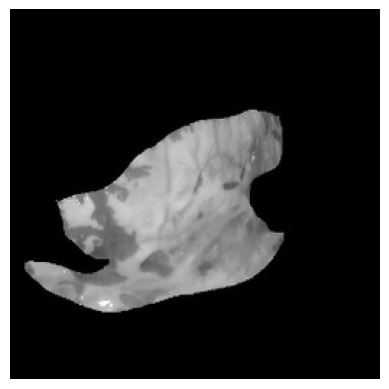


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00053/images ---

Características de la Imagen 00053.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


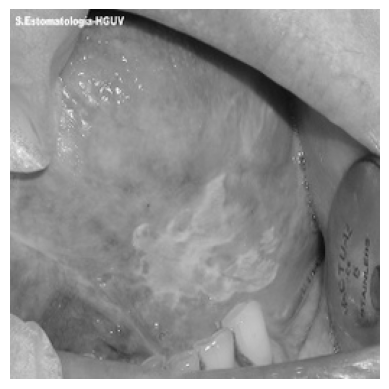


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00053/masks ---

Características de la Máscara 00053_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 196
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00139/images ---

Características de la Imagen 00139.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 41
Valor máximo de píxel: 234
Tipo de dato de los píxeles: uint8


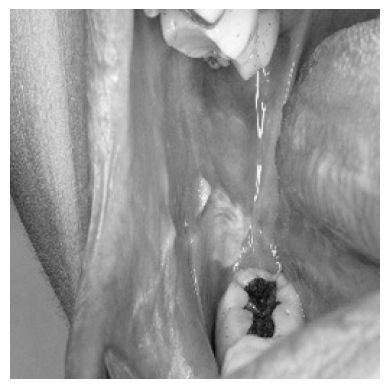


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00139/masks ---

Características de la Máscara 00139_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 229
Tipo de dato de los píxeles: uint8


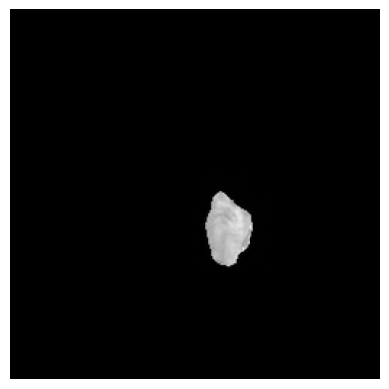


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00151/images ---

Características de la Imagen 00151.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00151/masks ---

Características de la Máscara 00151_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 234
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00051C/images ---

Características de la Imagen 00051C.png:
Tamaño de la imagen (alto, ancho,

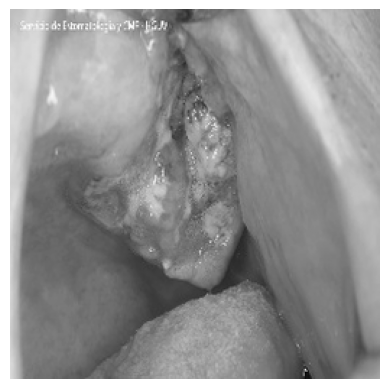


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00112C/masks ---

Características de la Máscara 00112C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 243
Tipo de dato de los píxeles: uint8


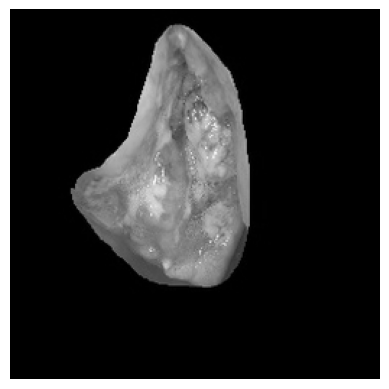


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00009C/images ---

Características de la Imagen 00009C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 11
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00009C/masks ---

Características de la Máscara 00009C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 178
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00122/images ---

Características de la Imagen 00122.png:
Tamaño de la imagen (alto, anch

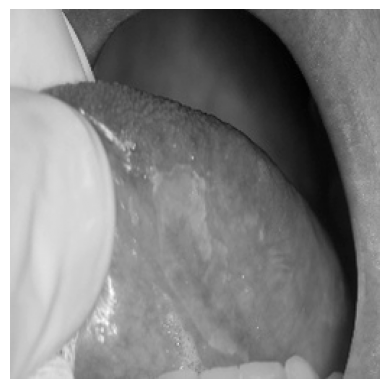


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00122/masks ---

Características de la Máscara 00122_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 187
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00160/images ---

Características de la Imagen 00160.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00160/masks ---

Características de la Máscara 00160_1.png:
Tamaño de la imagen (alto, ancho,

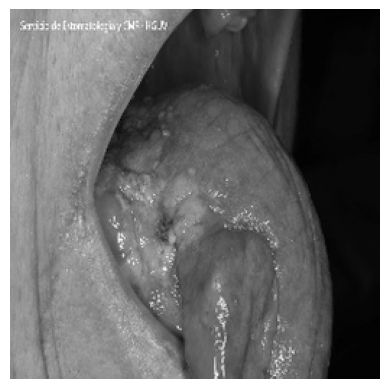


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00102C/masks ---

Características de la Máscara 00102C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00052C/images ---

Características de la Imagen 00052C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00052C/masks ---

Características de la Máscara 00052C_1.png:
Tamaño de la imagen (alto, a

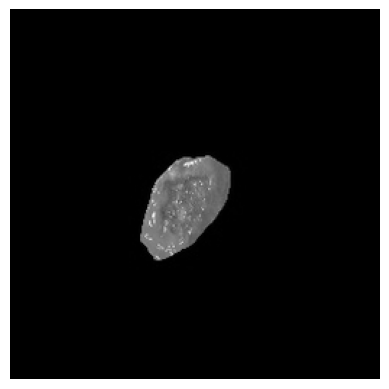


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00038/images ---

Características de la Imagen 00038.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 28
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


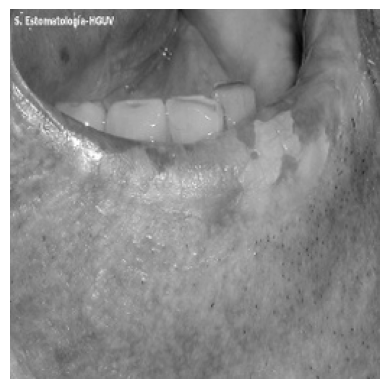


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00038/masks ---

Características de la Máscara 00038_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


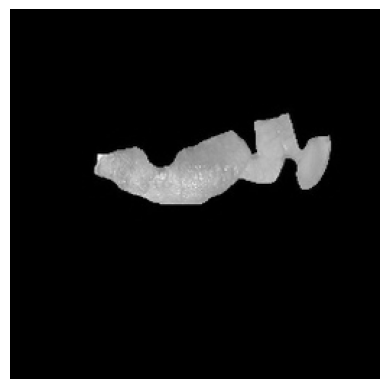


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00124/images ---

Características de la Imagen 00124.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 6
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00124/masks ---

Características de la Máscara 00124_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 146
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00169/images ---

Características de la Imagen 00169.png:
Tamaño de la imagen (alto, ancho, ca

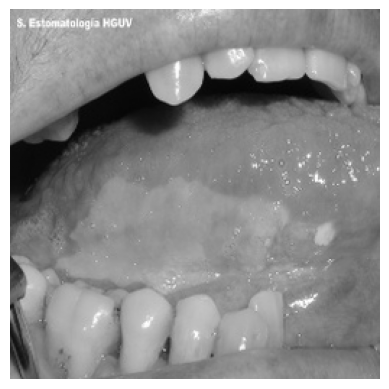


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00161/masks ---

Características de la Máscara 00161_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 237
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00021/images ---

Características de la Imagen 00021.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00021/masks ---

Características de la Máscara 00021_1.png:
Tamaño de la imagen (alto, ancho, 

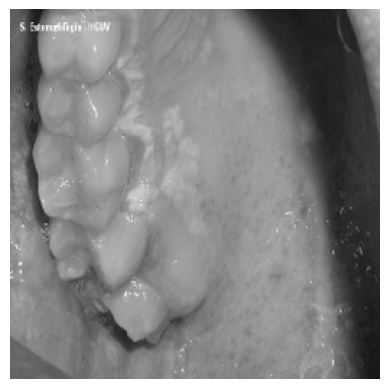


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00198/masks ---

Características de la Máscara 00198_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 239
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00065C/images ---

Características de la Imagen 00065C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00065C/masks ---

Características de la Máscara 00065C_1.png:
Tamaño de la imagen (alto, an

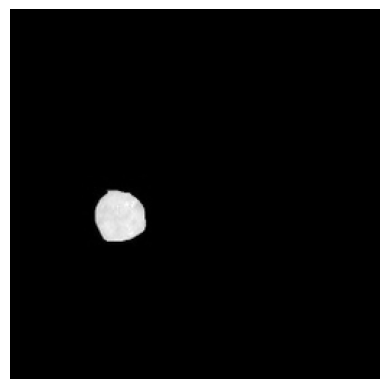


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00119C/images ---

Características de la Imagen 00119C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 2
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00119C/masks ---

Características de la Máscara 00119C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 226
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00079C/images ---

Características de la Imagen 00079C.png:
Tamaño de la imagen (alto, anc

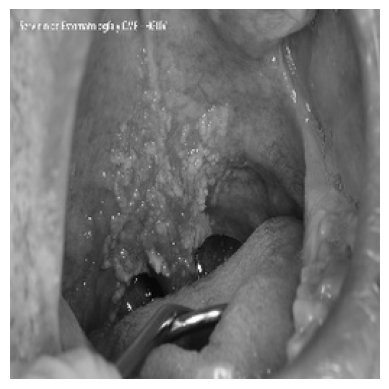


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00079C/masks ---

Características de la Máscara 00079C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


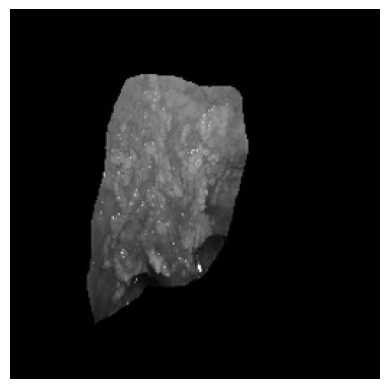


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00014C/images ---

Características de la Imagen 00014C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00014C/masks ---

Características de la Máscara 00014C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00013C/images ---

Características de la Imagen 00013C.png:
Tamaño de la imagen (alto, anc

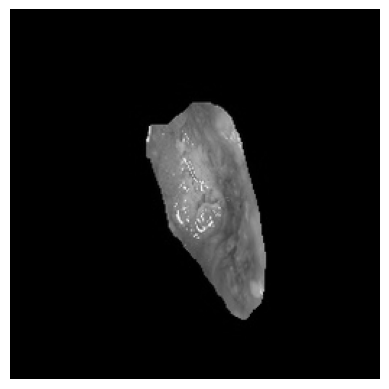


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00121/images ---

Características de la Imagen 00121.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 2
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00121/masks ---

Características de la Máscara 00121_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 191
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00060C/images ---

Características de la Imagen 00060C.png:
Tamaño de la imagen (alto, ancho, 

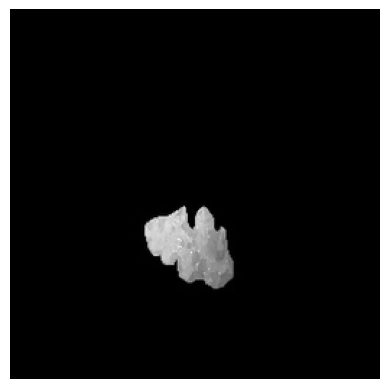


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00001/images ---

Características de la Imagen 00001.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00001/masks ---

Características de la Máscara 00001_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 227
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00038C/images ---

Características de la Imagen 00038C.png:
Tamaño de la imagen (alto, ancho, 

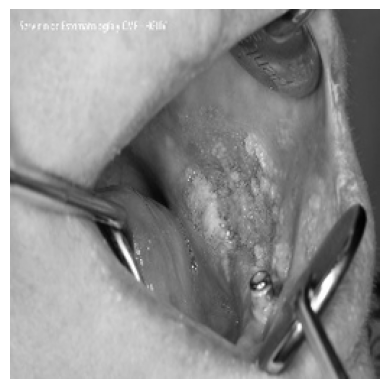


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00012C/masks ---

Características de la Máscara 00012C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 234
Tipo de dato de los píxeles: uint8


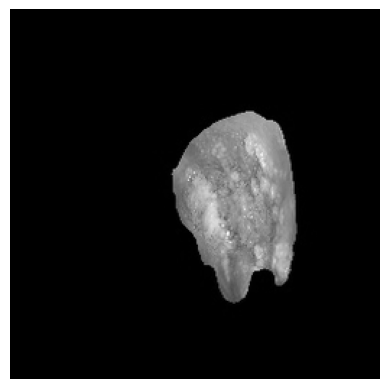


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00057/images ---

Características de la Imagen 00057.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00057/masks ---

Características de la Máscara 00057_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 230
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00003C/images ---

Características de la Imagen 00003C.png:
Tamaño de la imagen (alto, ancho, 

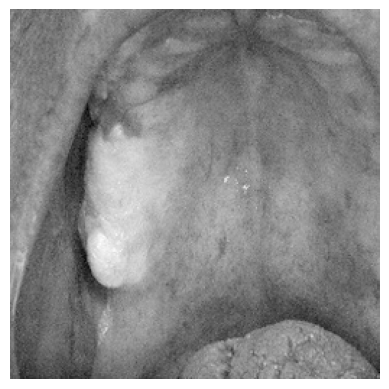


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00105/masks ---

Características de la Máscara 00105_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 217
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00129/images ---

Características de la Imagen 00129.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00129/masks ---

Características de la Máscara 00129_1.png:
Tamaño de la imagen (alto, ancho,

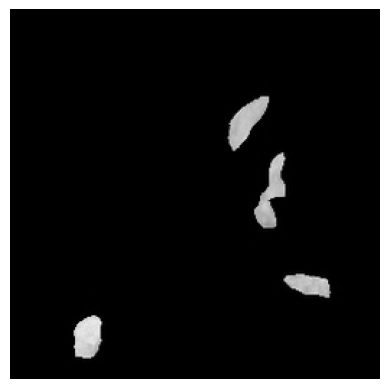


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00067C/images ---

Características de la Imagen 00067C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 54
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00067C/masks ---

Características de la Máscara 00067C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 206
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00032/images ---

Características de la Imagen 00032.png:
Tamaño de la imagen (alto, anch

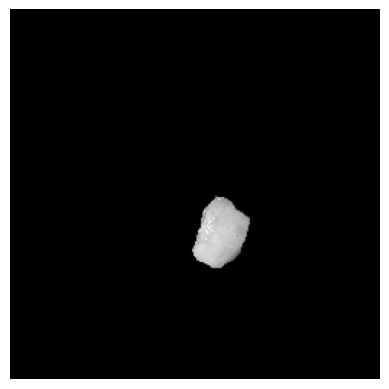


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00062C/images ---

Características de la Imagen 00062C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 22
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00062C/masks ---

Características de la Máscara 00062C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 250
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00133/images ---

Características de la Imagen 00133.png:
Tamaño de la imagen (alto, anch

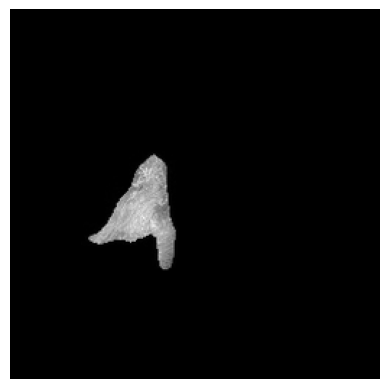


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00016/images ---

Características de la Imagen 00016.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00016/masks ---

Características de la Máscara 00016_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 229
Tipo de dato de los píxeles: uint8


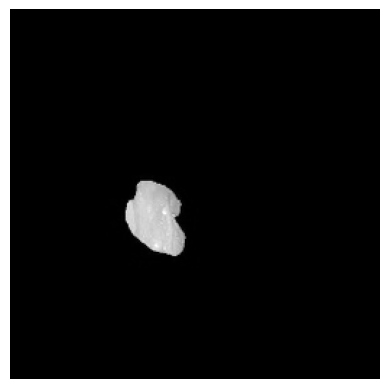


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00092/images ---

Características de la Imagen 00092.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 7
Valor máximo de píxel: 195
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00092/masks ---

Características de la Máscara 00092_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 196
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00023C/images ---

Características de la Imagen 00023C.png:
Tamaño de la imagen (alto, ancho, 

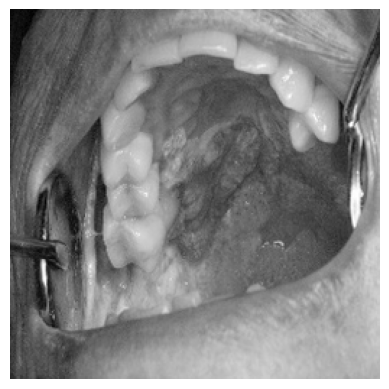


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00023C/masks ---

Características de la Máscara 00023C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 183
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00018/images ---

Características de la Imagen 00018.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00018/masks ---

Características de la Máscara 00018_1.png:
Tamaño de la imagen (alto, ancho

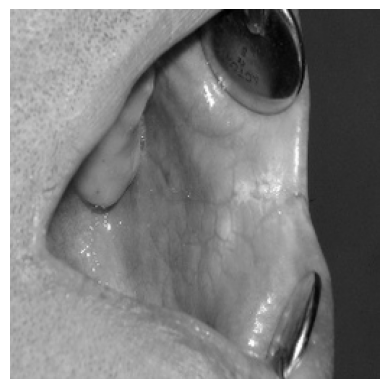


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00043/masks ---

Características de la Máscara 00043_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 253
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00089C/images ---

Características de la Imagen 00089C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00089C/masks ---

Características de la Máscara 00089C_1.png:
Tamaño de la imagen (alto, anc

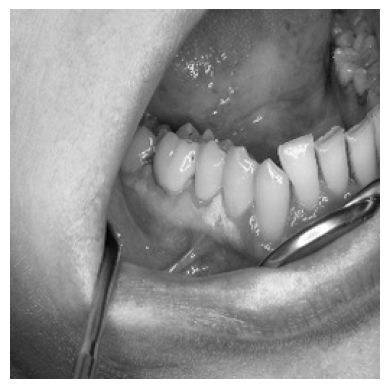


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00137/masks ---

Características de la Máscara 00137_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 238
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00192/images ---

Características de la Imagen 00192.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00192/masks ---

Características de la Máscara 00192_1.png:
Tamaño de la imagen (alto, ancho, 

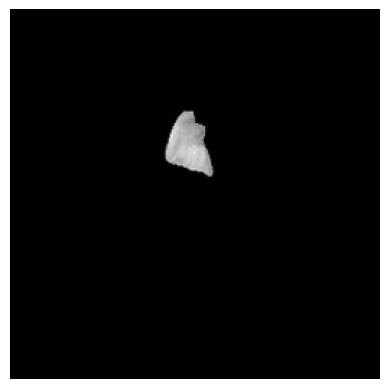


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00188/images ---

Características de la Imagen 00188.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 16
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00188/masks ---

Características de la Máscara 00188_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 201
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00081C/images ---

Características de la Imagen 00081C.png:
Tamaño de la imagen (alto, ancho,

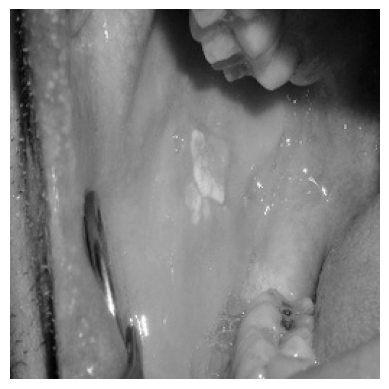


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00145/masks ---

Características de la Máscara 00145_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 224
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00060/images ---

Características de la Imagen 00060.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 3
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00060/masks ---

Características de la Máscara 00060_1.png:
Tamaño de la imagen (alto, ancho, 

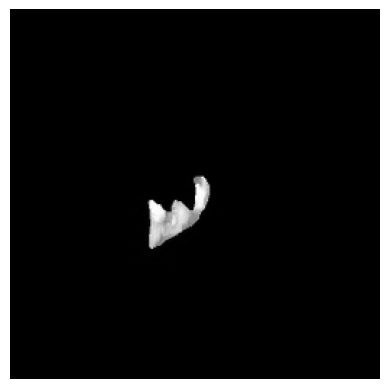


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00171/images ---

Características de la Imagen 00171.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 13
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


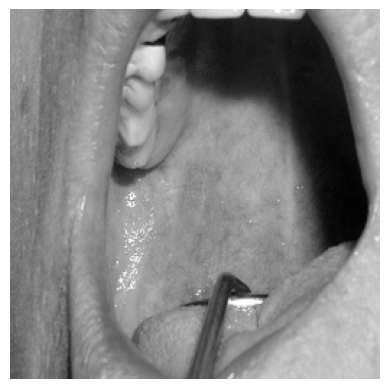


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00171/masks ---

Características de la Máscara 00171_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 205
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00037C/images ---

Características de la Imagen 00037C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00037C/masks ---

Características de la Máscara 00037C_1.png:
Tamaño de la imagen (alto, anc

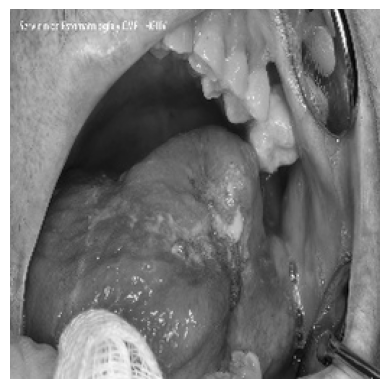


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00070C/masks ---

Características de la Máscara 00070C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 226
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00174/images ---

Características de la Imagen 00174.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 9
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00174/masks ---

Características de la Máscara 00174_1.png:
Tamaño de la imagen (alto, ancho

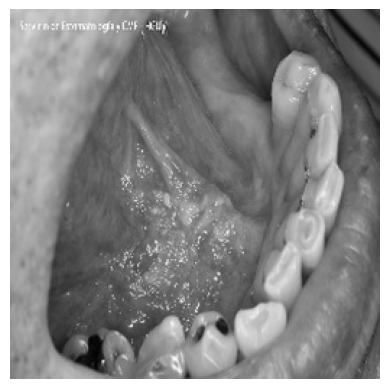


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00094C/masks ---

Características de la Máscara 00094C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 254
Tipo de dato de los píxeles: uint8


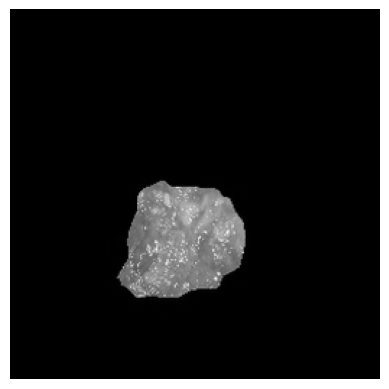


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00076C/images ---

Características de la Imagen 00076C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 11
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00076C/masks ---

Características de la Máscara 00076C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


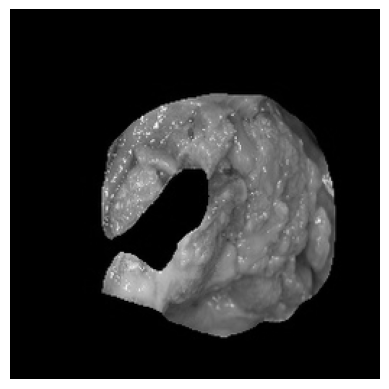


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00037/images ---

Características de la Imagen 00037.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


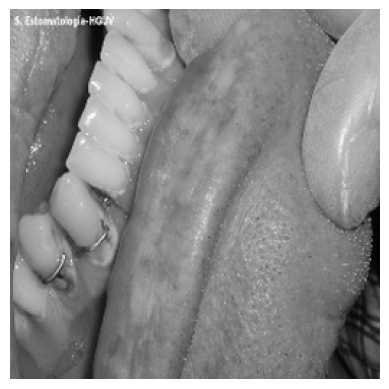


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00037/masks ---

Características de la Máscara 00037_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 186
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00007/images ---

Características de la Imagen 00007.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 19
Valor máximo de píxel: 250
Tipo de dato de los píxeles: uint8


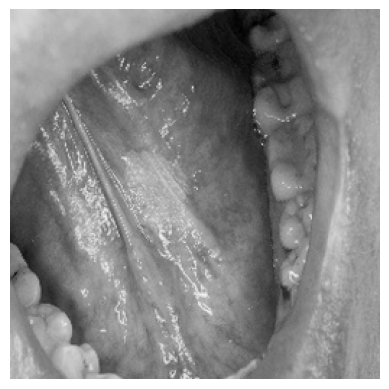


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00007/masks ---

Características de la Máscara 00007_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 249
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00028/images ---

Características de la Imagen 00028.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 19
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00028/masks ---

Características de la Máscara 00028_1.png:
Tamaño de la imagen (alto, ancho,

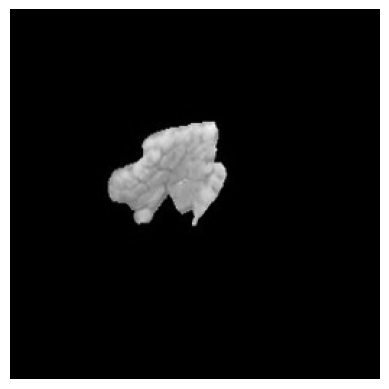


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00040C/images ---

Características de la Imagen 00040C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 8
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00040C/masks ---

Características de la Máscara 00040C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00191/images ---

Características de la Imagen 00191.png:
Tamaño de la imagen (alto, ancho

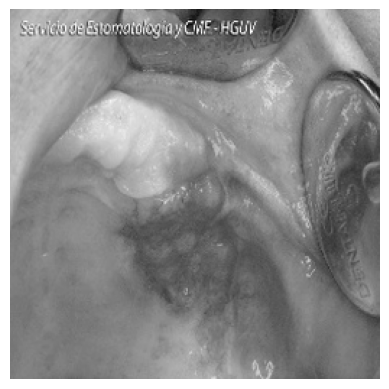


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00118C/masks ---

Características de la Máscara 00118C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 217
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00170/images ---

Características de la Imagen 00170.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 13
Valor máximo de píxel: 217
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00170/masks ---

Características de la Máscara 00170_1.png:
Tamaño de la imagen (alto, anch

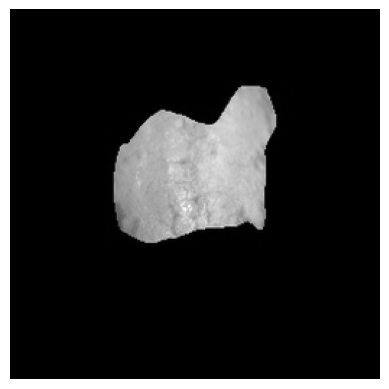


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00134/images ---

Características de la Imagen 00134.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 16
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00134/masks ---

Características de la Máscara 00134_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 252
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00019C/images ---

Características de la Imagen 00019C.png:
Tamaño de la imagen (alto, ancho,

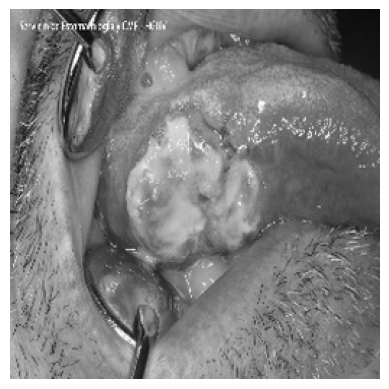


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00019C/masks ---

Características de la Máscara 00019C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00202/images ---

Características de la Imagen 00202.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 11
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


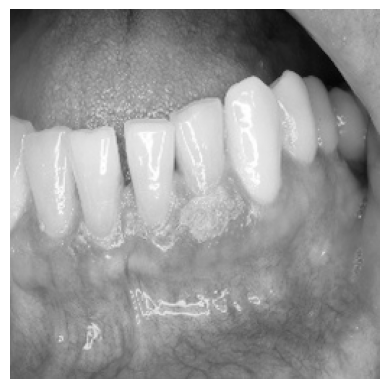


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00202/masks ---

Características de la Máscara 00202_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 248
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00027C/images ---

Características de la Imagen 00027C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 13
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00027C/masks ---

Características de la Máscara 00027C_1.png:
Tamaño de la imagen (alto, an

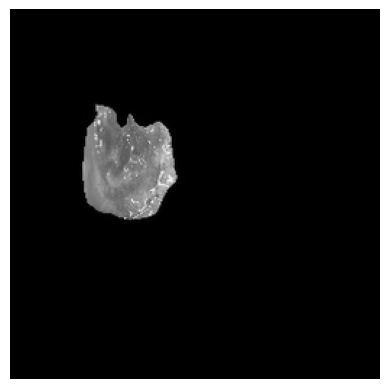


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00097C/images ---

Características de la Imagen 00097C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 6
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


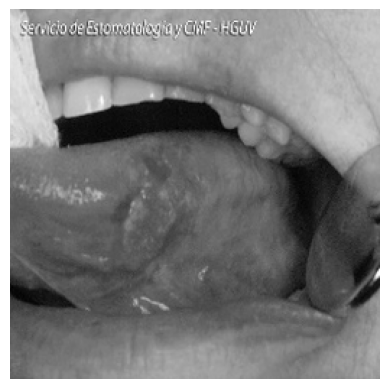


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00097C/masks ---

Características de la Máscara 00097C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 163
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00013/images ---

Características de la Imagen 00013.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 3
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00013/masks ---

Características de la Máscara 00013_1.png:
Tamaño de la imagen (alto, ancho

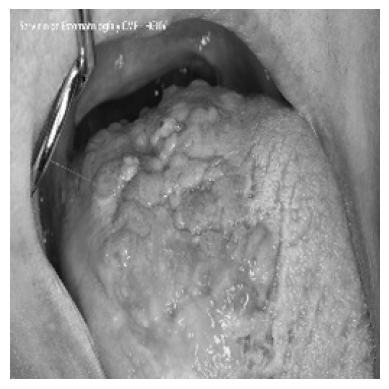


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00066C/masks ---

Características de la Máscara 00066C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 254
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00096/images ---

Características de la Imagen 00096.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 24
Valor máximo de píxel: 234
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00096/masks ---

Características de la Máscara 00096_1.png:
Tamaño de la imagen (alto, anch

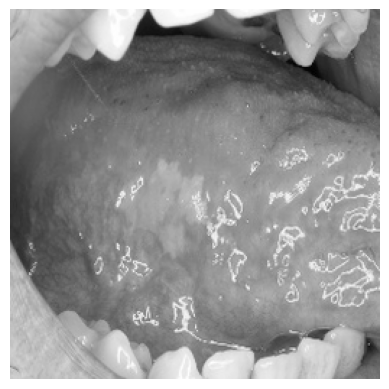


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00099/masks ---

Características de la Máscara 00099_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 248
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00136/images ---

Características de la Imagen 00136.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 24
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00136/masks ---

Características de la Máscara 00136_1.png:
Tamaño de la imagen (alto, ancho,

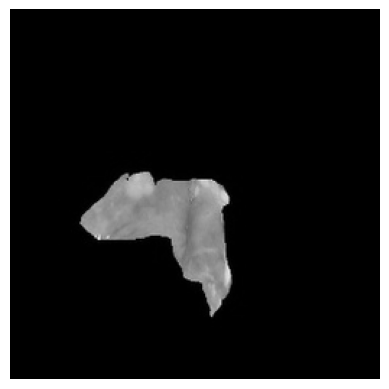


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00125/images ---

Características de la Imagen 00125.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 21
Valor máximo de píxel: 229
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00125/masks ---

Características de la Máscara 00125_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 216
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00012/images ---

Características de la Imagen 00012.png:
Tamaño de la imagen (alto, ancho, c

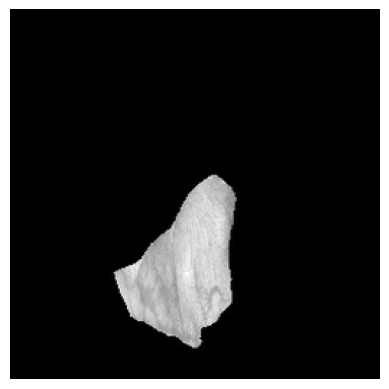


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00050C/images ---

Características de la Imagen 00050C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 16
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00050C/masks ---

Características de la Máscara 00050C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00096C/images ---

Características de la Imagen 00096C.png:
Tamaño de la imagen (alto, an

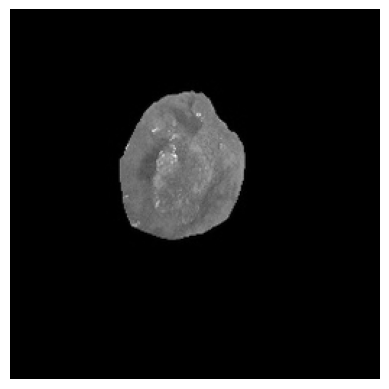


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00190/images ---

Características de la Imagen 00190.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 1
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00190/masks ---

Características de la Máscara 00190_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 246
Tipo de dato de los píxeles: uint8


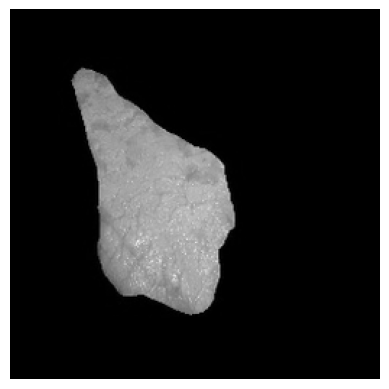


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00018C/images ---

Características de la Imagen 00018C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00018C/masks ---

Características de la Máscara 00018C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 241
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00104C/images ---

Características de la Imagen 00104C.png:
Tamaño de la imagen (alto, anc

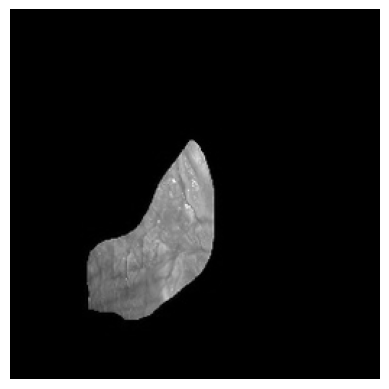


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00088C/images ---

Características de la Imagen 00088C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 36
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00088C/masks ---

Características de la Máscara 00088C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 236
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00015C/images ---

Características de la Imagen 00015C.png:
Tamaño de la imagen (alto, an

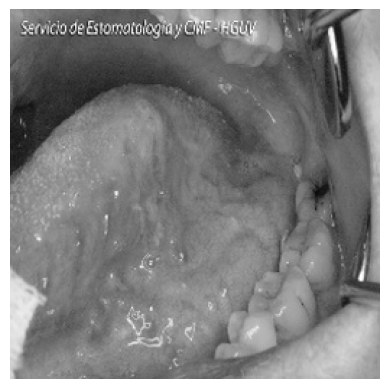


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00015C/masks ---

Características de la Máscara 00015C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 187
Tipo de dato de los píxeles: uint8


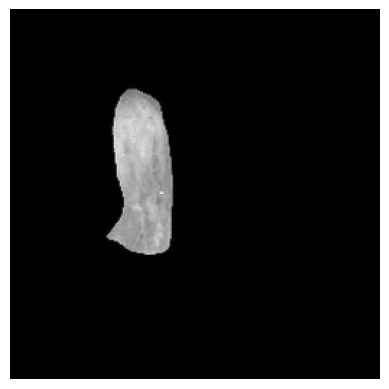


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00045/images ---

Características de la Imagen 00045.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 13
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00045/masks ---

Características de la Máscara 00045_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 228
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00020C/images ---

Características de la Imagen 00020C.png:
Tamaño de la imagen (alto, ancho,

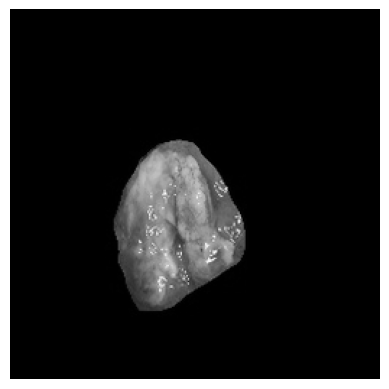


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00077/images ---

Características de la Imagen 00077.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 9
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00077/masks ---

Características de la Máscara 00077_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00058/images ---

Características de la Imagen 00058.png:
Tamaño de la imagen (alto, ancho, ca

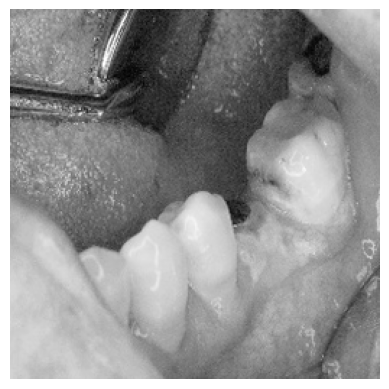


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00120/masks ---

Características de la Máscara 00120_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 224
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00118/images ---

Características de la Imagen 00118.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 9
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00118/masks ---

Características de la Máscara 00118_1.png:
Tamaño de la imagen (alto, ancho, 

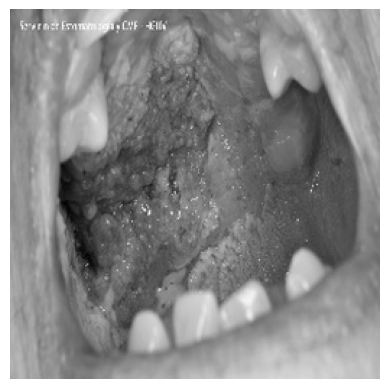


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00021C/masks ---

Características de la Máscara 00021C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


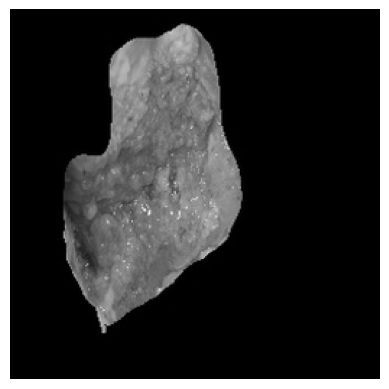


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00088/images ---

Características de la Imagen 00088.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 7
Valor máximo de píxel: 234
Tipo de dato de los píxeles: uint8


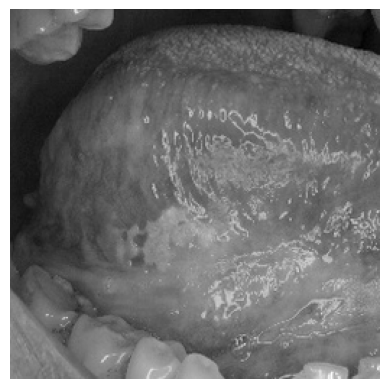


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00088/masks ---

Características de la Máscara 00088_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 180
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00067/images ---

Características de la Imagen 00067.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00067/masks ---

Características de la Máscara 00067_1.png:
Tamaño de la imagen (alto, ancho,

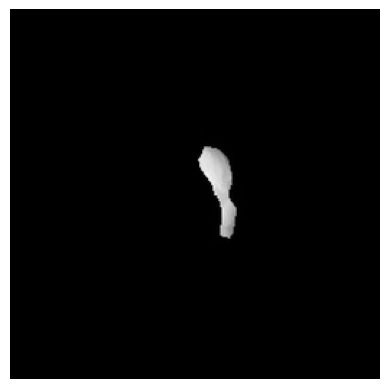


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00177/images ---

Características de la Imagen 00177.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 2
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00177/masks ---

Características de la Máscara 00177_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 236
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00026C/images ---

Características de la Imagen 00026C.png:
Tamaño de la imagen (alto, ancho, 

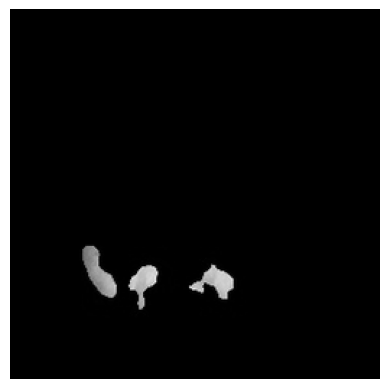


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00008/images ---

Características de la Imagen 00008.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 20
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00008/masks ---

Características de la Máscara 00008_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 199
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00041C/images ---

Características de la Imagen 00041C.png:
Tamaño de la imagen (alto, ancho,

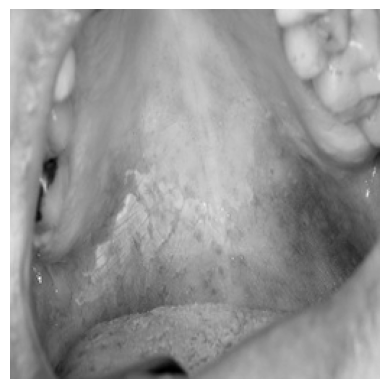


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00155/masks ---

Características de la Máscara 00155_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00085/images ---

Características de la Imagen 00085.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 22
Valor máximo de píxel: 233
Tipo de dato de los píxeles: uint8


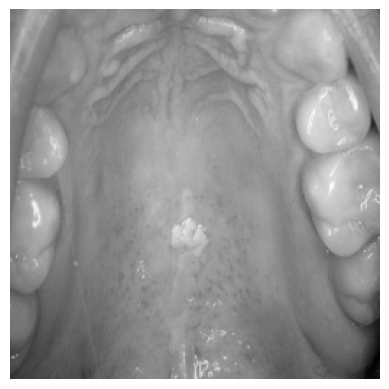


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00085/masks ---

Características de la Máscara 00085_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 226
Tipo de dato de los píxeles: uint8


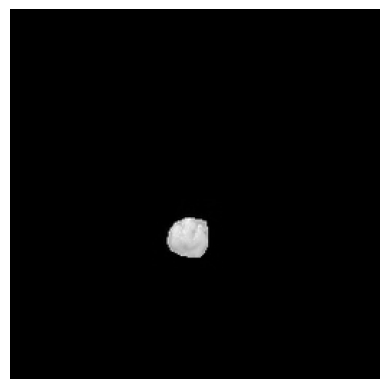


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00090/images ---

Características de la Imagen 00090.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 33
Valor máximo de píxel: 253
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00090/masks ---

Características de la Máscara 00090_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 172
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00182/images ---

Características de la Imagen 00182.png:
Tamaño de la imagen (alto, ancho, c

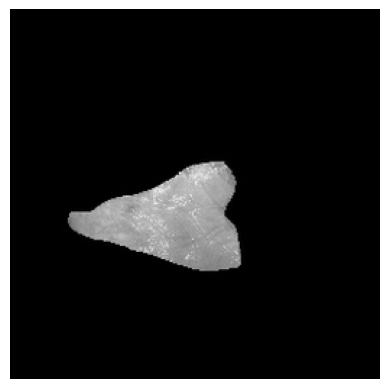


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00153/images ---

Características de la Imagen 00153.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 9
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00153/masks ---

Características de la Máscara 00153_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 190
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00187/images ---

Características de la Imagen 00187.png:
Tamaño de la imagen (alto, ancho, ca

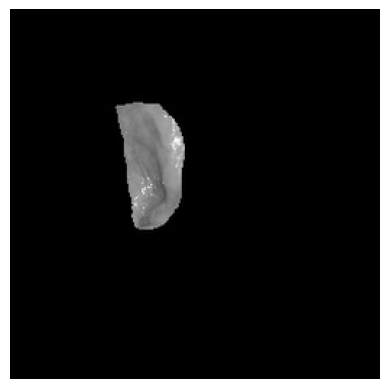


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00199/images ---

Características de la Imagen 00199.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 32
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


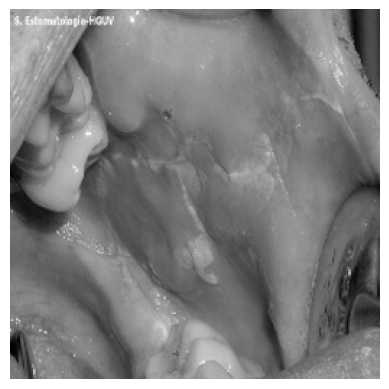


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00199/masks ---

Características de la Máscara 00199_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 210
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00075C/images ---

Características de la Imagen 00075C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 63
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00075C/masks ---

Características de la Máscara 00075C_1.png:
Tamaño de la imagen (alto, an

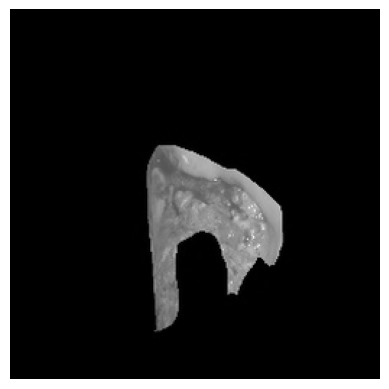


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00015/images ---

Características de la Imagen 00015.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 44
Valor máximo de píxel: 229
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00015/masks ---

Características de la Máscara 00015_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 241
Tipo de dato de los píxeles: uint8


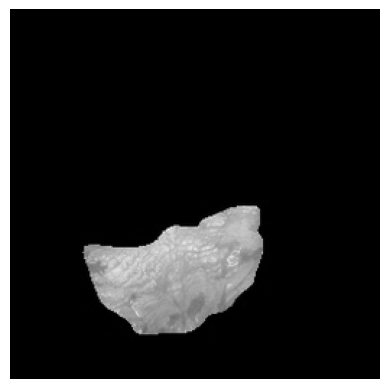


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00046/images ---

Características de la Imagen 00046.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 9
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00046/masks ---

Características de la Máscara 00046_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 233
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00095/images ---

Características de la Imagen 00095.png:
Tamaño de la imagen (alto, ancho, ca

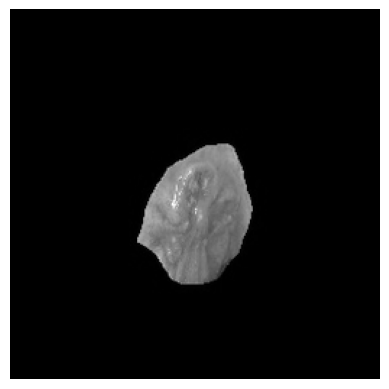


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00043C/images ---

Características de la Imagen 00043C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00043C/masks ---

Características de la Máscara 00043C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 228
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00097/images ---

Características de la Imagen 00097.png:
Tamaño de la imagen (alto, ancho

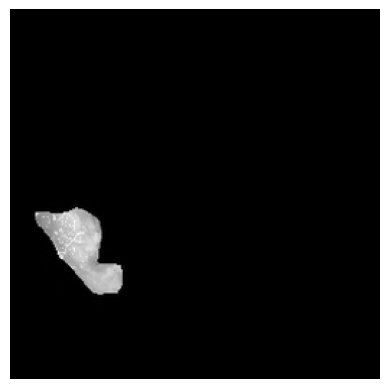


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00110/images ---

Características de la Imagen 00110.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


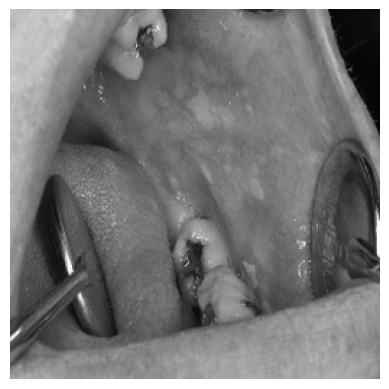


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00110/masks ---

Características de la Máscara 00110_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 172
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00200/images ---

Características de la Imagen 00200.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 13
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00200/masks ---

Características de la Máscara 00200_1.png:
Tamaño de la imagen (alto, ancho,

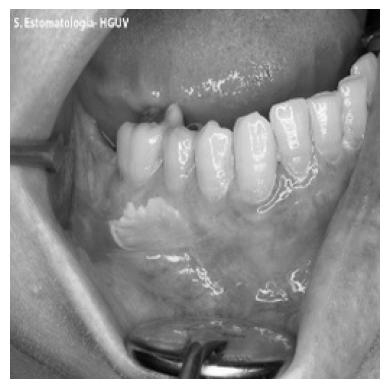


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00009/masks ---

Características de la Máscara 00009_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 222
Tipo de dato de los píxeles: uint8


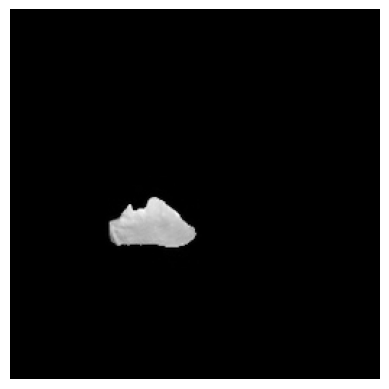


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00066/images ---

Características de la Imagen 00066.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 5
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00066/masks ---

Características de la Máscara 00066_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 196
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00196/images ---

Características de la Imagen 00196.png:
Tamaño de la imagen (alto, ancho, ca

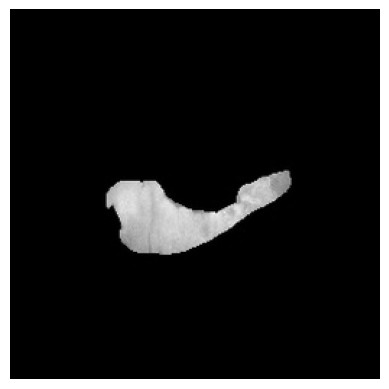


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00149/images ---

Características de la Imagen 00149.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 11
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00149/masks ---

Características de la Máscara 00149_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00081/images ---

Características de la Imagen 00081.png:
Tamaño de la imagen (alto, ancho, c

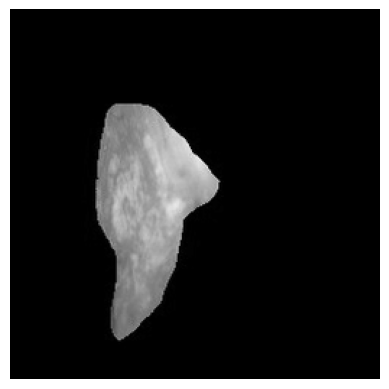


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00143/images ---

Características de la Imagen 00143.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 238
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00143/masks ---

Características de la Máscara 00143_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 214
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00004C/images ---

Características de la Imagen 00004C.png:
Tamaño de la imagen (alto, ancho,

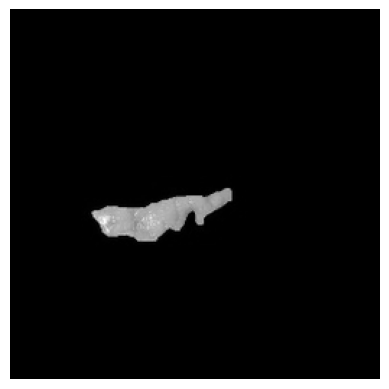


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00094/images ---

Características de la Imagen 00094.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 14
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00094/masks ---

Características de la Máscara 00094_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 172
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00029/images ---

Características de la Imagen 00029.png:
Tamaño de la imagen (alto, ancho, c

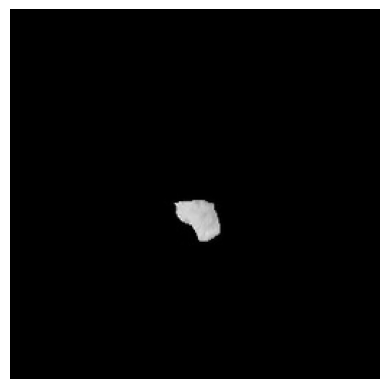


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00117/images ---

Características de la Imagen 00117.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 8
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00117/masks ---

Características de la Máscara 00117_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 180
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00002/images ---

Características de la Imagen 00002.png:
Tamaño de la imagen (alto, ancho, ca

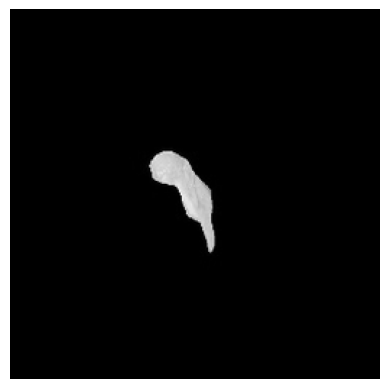


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00201/images ---

Características de la Imagen 00201.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 2
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00201/masks ---

Características de la Máscara 00201_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 190
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00006C/images ---

Características de la Imagen 00006C.png:
Tamaño de la imagen (alto, ancho, 

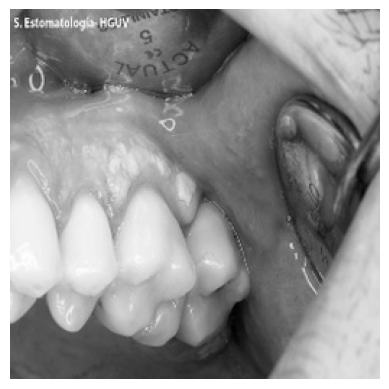


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00055/masks ---

Características de la Máscara 00055_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 250
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00041/images ---

Características de la Imagen 00041.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 8
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00041/masks ---

Características de la Máscara 00041_1.png:
Tamaño de la imagen (alto, ancho, 

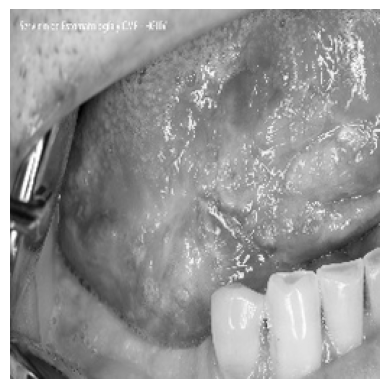


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00058C/masks ---

Características de la Máscara 00058C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00064C/images ---

Características de la Imagen 00064C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 10
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00064C/masks ---

Características de la Máscara 00064C_1.png:
Tamaño de la imagen (alto, 

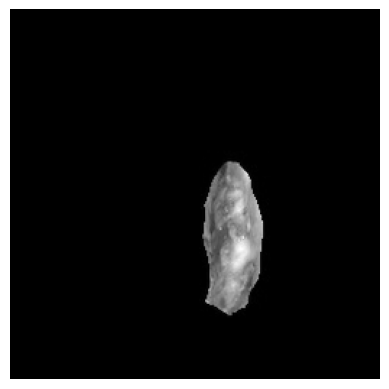


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00075/images ---

Características de la Imagen 00075.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00075/masks ---

Características de la Máscara 00075_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 243
Tipo de dato de los píxeles: uint8


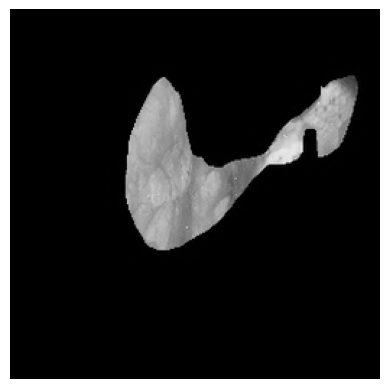


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00092C/images ---

Características de la Imagen 00092C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00092C/masks ---

Características de la Máscara 00092C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 243
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00035/images ---

Características de la Imagen 00035.png:
Tamaño de la imagen (alto, ancho

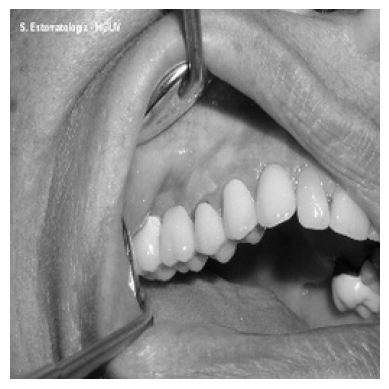


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00035/masks ---

Características de la Máscara 00035_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 203
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00184/images ---

Características de la Imagen 00184.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 18
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


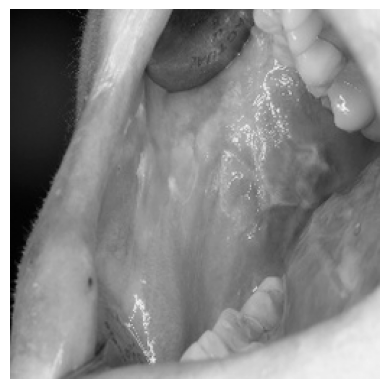


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00184/masks ---

Características de la Máscara 00184_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 224
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00164/images ---

Características de la Imagen 00164.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00164/masks ---

Características de la Máscara 00164_1.png:
Tamaño de la imagen (alto, ancho, 

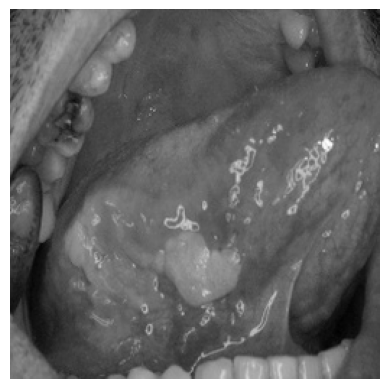


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00080/masks ---

Características de la Máscara 00080_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 195
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00045C/images ---

Características de la Imagen 00045C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 22
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00045C/masks ---

Características de la Máscara 00045C_1.png:
Tamaño de la imagen (alto, an

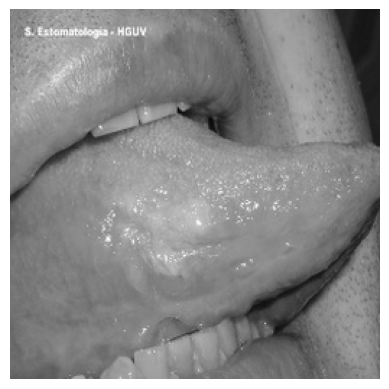


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00048/masks ---

Características de la Máscara 00048_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00146/images ---

Características de la Imagen 00146.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 18
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


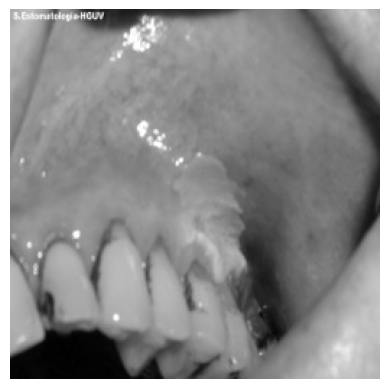


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00146/masks ---

Características de la Máscara 00146_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 211
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00010C/images ---

Características de la Imagen 00010C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 7
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00010C/masks ---

Características de la Máscara 00010C_1.png:
Tamaño de la imagen (alto, anc

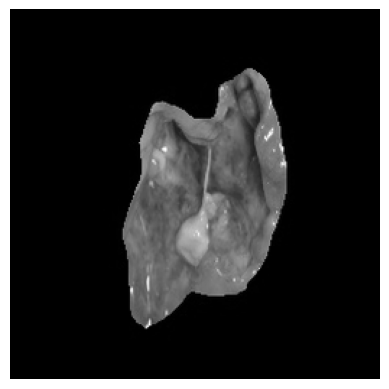


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00148/images ---

Características de la Imagen 00148.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 38
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00148/masks ---

Características de la Máscara 00148_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 217
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00123/images ---

Características de la Imagen 00123.png:
Tamaño de la imagen (alto, ancho, c

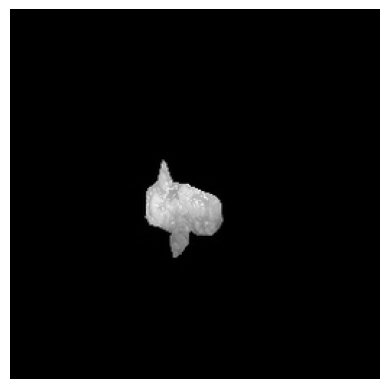


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00142/images ---

Características de la Imagen 00142.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 11
Valor máximo de píxel: 247
Tipo de dato de los píxeles: uint8


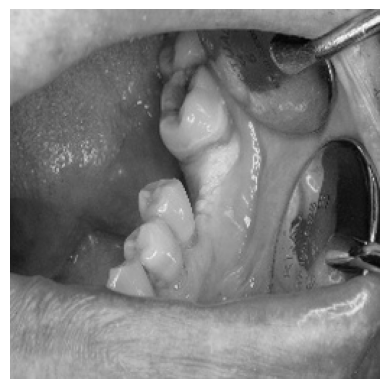


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00142/masks ---

Características de la Máscara 00142_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 234
Tipo de dato de los píxeles: uint8


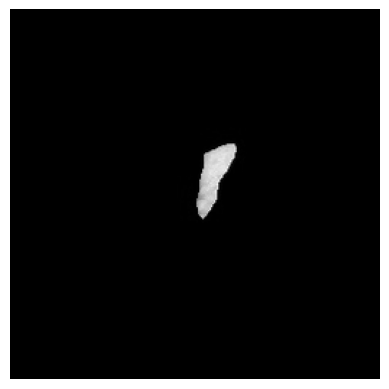


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00030/images ---

Características de la Imagen 00030.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 11
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00030/masks ---

Características de la Máscara 00030_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 251
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00194/images ---

Características de la Imagen 00194.png:
Tamaño de la imagen (alto, ancho, c

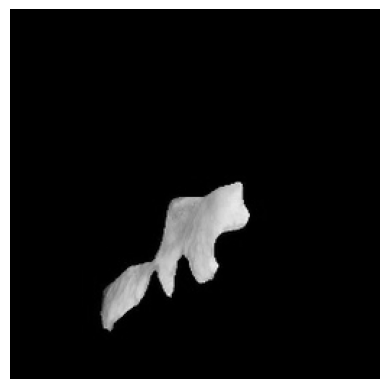


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00099C/images ---

Características de la Imagen 00099C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 19
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00099C/masks ---

Características de la Máscara 00099C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 254
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00135/images ---

Características de la Imagen 00135.png:
Tamaño de la imagen (alto, anch

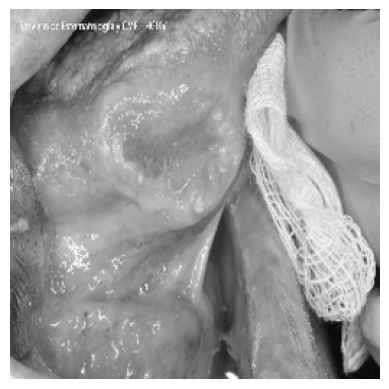


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00033C/masks ---

Características de la Máscara 00033C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 250
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00073/images ---

Características de la Imagen 00073.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 16
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00073/masks ---

Características de la Máscara 00073_1.png:
Tamaño de la imagen (alto, anch

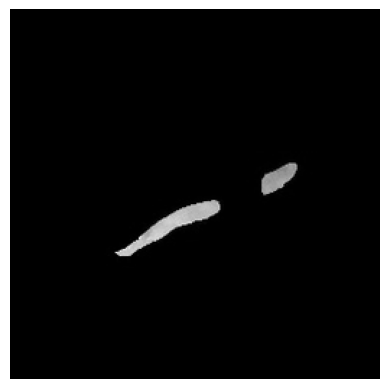


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00042C/images ---

Características de la Imagen 00042C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 8
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00042C/masks ---

Características de la Máscara 00042C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00054/images ---

Características de la Imagen 00054.png:
Tamaño de la imagen (alto, ancho

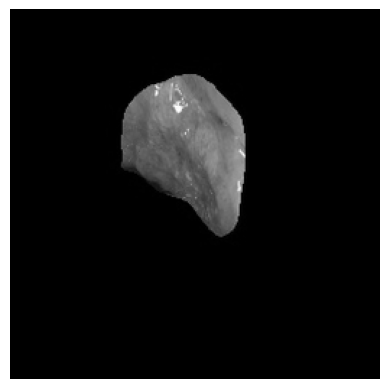


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00132/images ---

Características de la Imagen 00132.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 19
Valor máximo de píxel: 254
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00132/masks ---

Características de la Máscara 00132_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 187
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00049/images ---

Características de la Imagen 00049.png:
Tamaño de la imagen (alto, ancho, c

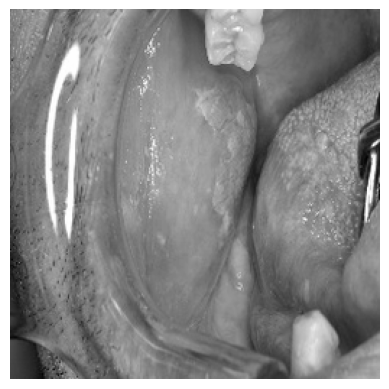


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00114/masks ---

Características de la Máscara 00114_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 219
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00107/images ---

Características de la Imagen 00107.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 5
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00107/masks ---

Características de la Máscara 00107_1.png:
Tamaño de la imagen (alto, ancho, 

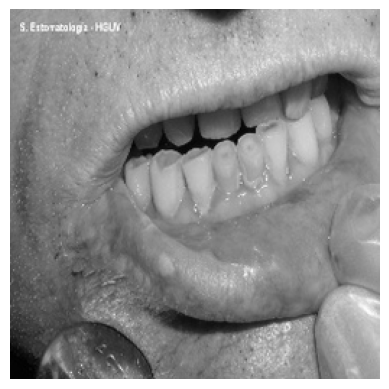


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00020/masks ---

Características de la Máscara 00020_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 250
Tipo de dato de los píxeles: uint8


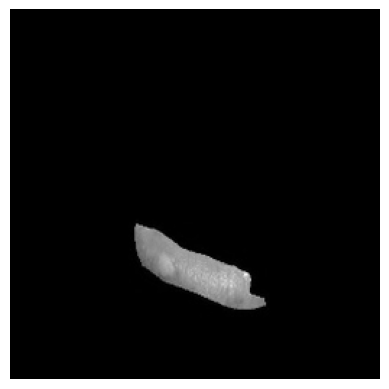


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00008C/images ---

Características de la Imagen 00008C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 19
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00008C/masks ---

Características de la Máscara 00008C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 231
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00054C/images ---

Características de la Imagen 00054C.png:
Tamaño de la imagen (alto, an

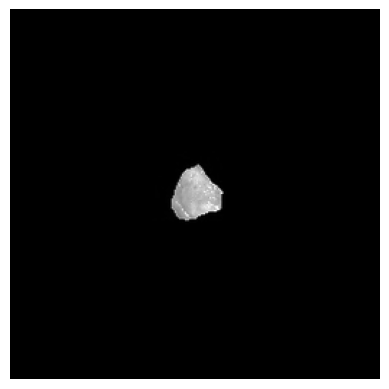


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00036C/images ---

Características de la Imagen 00036C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 1
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00036C/masks ---

Características de la Máscara 00036C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 253
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00025C/images ---

Características de la Imagen 00025C.png:
Tamaño de la imagen (alto, anc

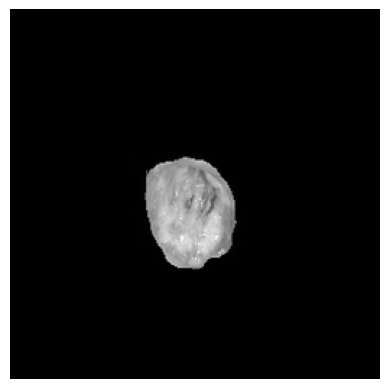


--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00101/images ---

Características de la Imagen 00101.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 1
Valor máximo de píxel: 225
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00101/masks ---

Características de la Máscara 00101_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 212
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00111C/images ---

Características de la Imagen 00111C.png:
Tamaño de la imagen (alto, ancho, 

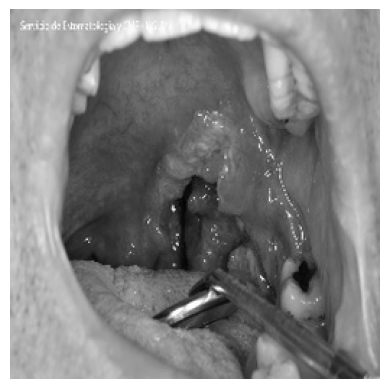


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00111C/masks ---

Características de la Máscara 00111C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 249
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00082/images ---

Características de la Imagen 00082.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 13
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00082/masks ---

Características de la Máscara 00082_1.png:
Tamaño de la imagen (alto, anch

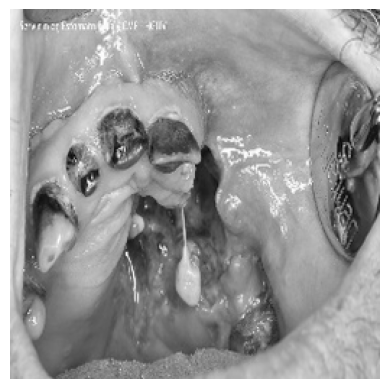


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00011C/masks ---

Características de la Máscara 00011C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00046C/images ---

Características de la Imagen 00046C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8


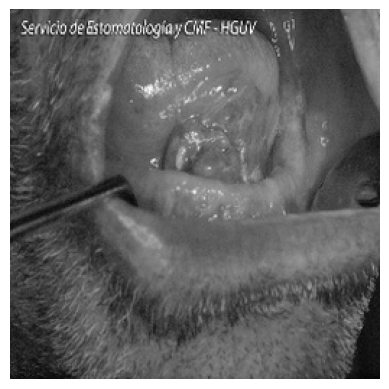


--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00046C/masks ---

Características de la Máscara 00046C_1.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 0
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las imágenes en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00117C/images ---

Características de la Imagen 00117C.png:
Tamaño de la imagen (alto, ancho, canales): (256, 256, 1)
Número de canales: 1
Valor mínimo de píxel: 45
Valor máximo de píxel: 255
Tipo de dato de los píxeles: uint8

--- Características de las máscaras en /home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00117C/masks ---

Características de la Máscara 00117C_1.png:
Tamaño de la imagen (alto, 

In [11]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

resized_output_path = "/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris"

def get_image_characteristics(image_path):
    img = Image.open(image_path).convert("L")  # Escala de grises (1 canal)
    img_array = np.array(img)

    characteristics = {
        "Tamaño de la imagen (alto, ancho, canales)": (*img_array.shape, 1),  # canal manual
        "Número de canales": 1,
        "Valor mínimo de píxel": np.min(img_array),
        "Valor máximo de píxel": np.max(img_array),
        "Tipo de dato de los píxeles": img_array.dtype
    }

    return characteristics, img

def show_image(image):
    plt.imshow(image, cmap='gray')  # escala de grises
    plt.axis('off')
    plt.show()

for subdir in os.listdir(resized_output_path):
    subdir_path = os.path.join(resized_output_path, subdir)

    if os.path.isdir(subdir_path):
        images_dir = os.path.join(subdir_path, "images")
        masks_dir = os.path.join(subdir_path, "masks")

        if os.path.exists(images_dir):
            print(f"\n--- Características de las imágenes en {images_dir} ---")
            image_files = [f for f in os.listdir(images_dir) if f.lower().endswith((".jpg", ".png"))]
            for image_file in image_files:
                image_path = os.path.join(images_dir, image_file)
                characteristics, img = get_image_characteristics(image_path)

                print(f"\nCaracterísticas de la Imagen {image_file}:")
                for key, value in characteristics.items():
                    print(f"{key}: {value}")

                if random.random() < 0.2:
                    show_image(img)

        if os.path.exists(masks_dir):
            print(f"\n--- Características de las máscaras en {masks_dir} ---")
            mask_files = [f for f in os.listdir(masks_dir) if f.lower().endswith((".jpg", ".png"))]
            for mask_file in mask_files:
                mask_path = os.path.join(masks_dir, mask_file)
                characteristics, mask = get_image_characteristics(mask_path)

                print(f"\nCaracterísticas de la Máscara {mask_file}:")
                for key, value in characteristics.items():
                    print(f"{key}: {value}")

                if random.random() < 0.2:
                    show_image(mask)

print("\nProceso completado.")

In [12]:
import os
from PIL import Image

folder_path = "/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris"

for root, dirs, files in os.walk(folder_path):
    for f in files:
        if f.lower().endswith(".png"):
            img_path = os.path.join(root, f)
            img = Image.open(img_path)
            print(f"{img_path} -> mode: {img.mode}")


/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00069C/masks/00069C_1.png -> mode: L
/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00069C/images/00069C.png -> mode: L
/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00047C/masks/00047C_1.png -> mode: L
/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00047C/images/00047C.png -> mode: L
/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00115C/masks/00115C_1.png -> mode: L
/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gris/00115C/images/00115C.png -> mode: L
/home/anna/TFM/TFM-Radiomica/U-Net---Biomedical-Image-Segmentation/data/Resized_Organized_Cancer_Controles_gr